In [14]:
### Imports

# Plotting imports
import plotly.express as px
import matplotlib.colors as mcolors
import matplotlib.patheffects as path_effects
import matplotlib.cm as cm
from matplotlib.colors import Normalize
from matplotlib.ticker import AutoMinorLocator
from matplotlib import pyplot as plt, ticker as mticker
from matplotlib.lines import Line2D
from matplotlib.dates import MonthLocator, YearLocator, DateFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Machine learning imports
from sklearn import preprocessing
from sklearn.svm import SVR
from sklearn.svm import SVC
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import Ridge, Lasso, RidgeCV
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor

# Misc
from dateutil.relativedelta import relativedelta
import numpy as np
import pandas as pd
import seaborn as sns
import datetime as dt
import requests
import calendar
import pickle
import time

In [15]:
### Constants

# The user that the stats will be built for
masterUser = 'Jamie'

# Plotting
legendColor = 'w'
backgroundColor = '#292929' # Dark grey
hotColdColors = np.array(['tab:blue', 'w', 'tab:red'])
difficultyColors = np.array(['limegreen', 'yellow', 'darkorange', 'red']) # Easy, Medium, Hard, Very hard
standardCanvasHeight = 8
standardCanvasWidth = 16
legendTextSize = 16
axisLabelSize = 26
tickLabelSize = 14
titleSize = 32
DPI = 360 # dots per inch (resolution)

# Misc
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
docTrailsFile = 'dataSources/MyTrails.csv'
dateFormat = '%Y-%m-%d'

<b><font size="3">Setting Up Data</font></b>

In [20]:
### Importing Trail Data

# Trails from my personal dataset
docTrails = pd.read_csv(docTrailsFile, parse_dates=['start_date', 'end_date'], engine='python')

originalColumns = docTrails.columns

docTrails['start_date'] = docTrails.start_date.dt.date
docTrails['end_date'] = docTrails.end_date.dt.date

# USA National Park Trails from AllTrails - https://github.com/j-ane/trail-data/tree/master
usaTrails = pd.read_csv('dataSources/AllTrailsUsaNationalParks.csv', engine='python', encoding='latin1')

# Renaming columns
usaTrails = usaTrails.rename(columns={'length': 'distance',
                                      'difficulty_rating':'difficulty',
                                      'avg_rating':'rating',
                                      'area_name':'park',
                                      'city_name':'region',
                                      'state_name':'province',
                                      'country_name':'country'})

In [21]:
### Fetching Weather and Climate Data

"""
Gets climate data via open-meteo API and saves.
Climate data is based on the weather data of the past 10 years relative to trail end_date.
Two days ago is used instead if the trail has not yet been completed (status == 1), to give the open-meteo time to collect data.
USA National Park trails had their climate date range from 2011-01-01 to 2020-12-31.

summerTemp (C): 0.98 quantile of daily max temps, a normal hot summer day
winterTemp (C): 0.02 quantile of daily min temps, a normal cold winter night
annualRain (mm): Average rain per year
annualSnow (cm): Average snow per year
"""
def addClimateDataAndSave(trails, outputCSV, forceOverwrite=False):

    numTrails = len(trails)

    summerTemp = trails['summer_temp'].copy()
    winterTemp = trails['winter_temp'].copy()
    annualRain = trails['annual_rain'].copy()
    annualSnow = trails['annual_snow'].copy()
    
    # Getting climate data one trail at a time
    for i, trail in enumerate(trails.itertuples(index=False)):

        if (np.isnan(trail.summer_temp) or np.isnan(trail.winter_temp)
            or np.isnan(trail.annual_rain) or np.isnan(trail.annual_snow)
            or forceOverwrite):
                    
            if trail.status == 0:
                climateRangeEndDate = trail.end_date
            else:
                climateRangeEndDate = dt.date.today() - relativedelta(days=2)
                
            climateRangeEndDateStr = climateRangeEndDate.strftime(dateFormat)
            climateRangeStartDateStr = (climateRangeEndDate - relativedelta(years=10)).strftime(dateFormat)
            
            time.sleep(10) # To get around request rate limit
            response = requests.get('https://archive-api.open-meteo.com/v1/archive?' 
                                    + f'latitude={trail.lat}&longitude={trail.lng}&start_date' 
                                    + f'={climateRangeStartDateStr}&end_date={climateRangeEndDateStr}&daily='
                                    + 'temperature_2m_max,temperature_2m_min,rain_sum,snowfall_sum&timezone=auto')
            
            try:
                responseDaily = response.json()['daily']
            except:
                print(response.json()['reason'])
                break
                            
            summerTemp[i] = np.quantile(responseDaily['temperature_2m_max'], 0.98) # 2% of days are hotter
            winterTemp[i] = np.quantile(responseDaily['temperature_2m_min'], 0.02) # 2% of days are colder
            annualRain[i] = np.sum(responseDaily['rain_sum'])/10 # average over 10 years
            annualSnow[i] = np.sum(responseDaily['snowfall_sum'])/10 # average over 10 years
    
        # Progress notifications
        if (i+1)%10 == 0 or (i+1) == numTrails or i == 0:
            print(f'Climate data obtained for {i+1} out of {numTrails} trails')
            
    trails['summer_temp'] = pd.Series(summerTemp)
    trails['winter_temp'] = pd.Series(winterTemp)
    trails['annual_rain'] = pd.Series(annualRain)
    trails['annual_snow'] = pd.Series(annualSnow)

    trails.to_csv(outputCSV, index=False)
    print('########## DONE FETCHING CLIMATE DATA ###########\n')

    return trails

"""
Gets weather data via API and saves.
For overnight trails, the hike is assumed to start and end at noon.
For day trails, the hike is assumed to be a 4 hour midday hike.

maxTemp (C): Maximum temperature
minTemp (C): Minimum temperature
rain (mm): Total rain
snow (cm): Total snow
"""
def addWeatherDataAndSave(trails, outputCSV, forceOverwrite=False):
    
    completedTrails = trails[trails.status == 0]
    numCompletedTrails = len(completedTrails)
    
    maxTemp = trails['max_temp'].copy()
    minTemp = trails['min_temp'].copy()
    rain = trails['rain'].copy()
    snow = trails['snow'].copy()
    
    # Getting weather data one trail at a time
    for i, trail in enumerate(trails.query('status==0').itertuples(index=False)):
                
        if (np.isnan(trail.max_temp) or np.isnan(trail.min_temp) 
            or np.isnan(trail.rain) or np.isnan(trail.snow) 
            or forceOverwrite):
                        
            time.sleep(60/600) # Limited to 600 requests per minute
            response = requests.get('https://archive-api.open-meteo.com/v1/archive?' 
                                    + f'latitude={trail.lat}&longitude={trail.lng}&' 
                                    + f'start_date={trail.start_date}&end_date={trail.end_date}' 
                                    + '&hourly=temperature_2m,rain,snowfall&timezone=America%2FNew_York')
            
            try:
                responseHourly = response.json()['hourly']
            except:
                print(response.json()['reason'])
                break

            numNights = (trail.end_date - trail.start_date).days
            if numNights > 0: # Overnight hikes are backpacking hikes
                hourOffset = 12 # Assume backpacking hikes start and end at noon
            else:
                hourOffset = 10 # Assume day hikes are 4 hour hikes at mid day
                
            maxTemp[i] = np.max(responseHourly['temperature_2m'][hourOffset:-hourOffset]) # max over period
            minTemp[i] = np.min(responseHourly['temperature_2m'][hourOffset:-hourOffset]) # min over period
            rain[i] = np.sum(responseHourly['rain'][hourOffset:-hourOffset])
            snow[i] = np.sum(responseHourly['snowfall'][hourOffset:-hourOffset])
        
        # Progress notifications 
        if (i+1)%10 == 0 or (i+1) == numCompletedTrails or i == 0:
            print(f'Weather data obtained for {i+1} out of {numCompletedTrails} trails')
    
    trails['max_temp'] = maxTemp
    trails['min_temp'] = minTemp
    trails['rain'] = rain
    trails['snow'] = snow
    
    trails.to_csv(outputCSV, index=False)
    print('########## DONE FETCHING WEATHER DATA ###########\n')
    
    return trails

docTrails = addWeatherDataAndSave(docTrails, docTrailsFile, forceOverwrite=False)
docTrails = addClimateDataAndSave(docTrails, docTrailsFile, forceOverwrite=False)

Weather data obtained for 1 out of 49 trails
Weather data obtained for 10 out of 49 trails
Weather data obtained for 20 out of 49 trails
Weather data obtained for 30 out of 49 trails
Weather data obtained for 40 out of 49 trails
Weather data obtained for 49 out of 49 trails
########## DONE FETCHING WEATHER DATA ###########

Climate data obtained for 1 out of 62 trails
Climate data obtained for 10 out of 62 trails
Climate data obtained for 20 out of 62 trails
Climate data obtained for 30 out of 62 trails
Climate data obtained for 40 out of 62 trails
Climate data obtained for 50 out of 62 trails
Climate data obtained for 60 out of 62 trails
Climate data obtained for 62 out of 62 trails
########## DONE FETCHING CLIMATE DATA ###########



In [22]:
### Setting Up My Personal Dataset

# Adding columns
docTrails['avg_temp'] = (docTrails.min_temp + docTrails.max_temp)/2
docTrails['nights'] = (pd.to_datetime(docTrails.end_date) - pd.to_datetime(docTrails.start_date)).dt.days
docTrails['days'] = docTrails.nights + 1
docTrails['backpacking'] = (docTrails['days'] > 1).astype(int) # 1 if days > 1, 0 otherwise
docTrails['order'] = docTrails[docTrails.user.notna() & (docTrails.user != '')].groupby('user').cumcount() + 1
docTrails['solo'] = docTrails.num_people == 1

# Hiking companion info
companionInstances = docTrails.query('user == @masterUser & status == 0').companions.dropna().str.split(', ').explode()
companions = sorted(companionInstances.unique())
for companion in companions:
    docTrails[companion] = docTrails.companions.fillna('').str.contains(companion).astype('int')

# Cleaning and filling data
docTrails['num_reviews'] = 1
docTrails['companions'] = docTrails.companions.fillna('')

# These are only used for the companion stats
docTrails['dist_per_day'] = docTrails.distance.divide(docTrails.days)
docTrails['gain_per_day'] = docTrails.elevation_gain.divide(docTrails.days)
docTrails['rain_per_day'] = docTrails.rain.divide(docTrails.days)
docTrails['snow_per_day'] = docTrails.snow.divide(docTrails.days)

# Defining different subsets of data
docCompletedTrails = docTrails.query('status == 0')
docCompletedBackpackingTrails = docCompletedTrails.query('backpacking == 1')

myCompletedTrails = docCompletedTrails.query('user == @masterUser')
myCompletedBackpackingTrails = myCompletedTrails.query('backpacking == 1')
                                               
myGroupTrails = myCompletedTrails.query('num_people > 1')
myGroupBackpackingTrails = myGroupTrails.query('backpacking == 1')
                                            
mySoloTrails = myCompletedTrails.query('num_people == 1')
mySoloBackpackingTrails = mySoloTrails.query('backpacking == 1')

uncompletedTrails = docTrails.query('status == 1') # Models will predict difficulty/enjoyment of these trails
uncompletedTrails.loc[:, 'user'] = masterUser

In [23]:
### Setting Up USA National Park Trails

# Adding/modifying columns
usaTrails['lat'] = usaTrails.apply(lambda trail: trail._geoloc.split(': ', 2)[1][:-7], axis=1)
usaTrails['lng'] = usaTrails.apply(lambda trail: trail._geoloc.split(': ', 2)[2][:-1], axis=1)

usaTrails['forest'] = usaTrails.features.str.contains('forest').astype(int)
usaTrails['lake'] = usaTrails.features.str.contains('lake').astype(int)
usaTrails['river'] = usaTrails.features.str.contains('river').astype(int)
usaTrails['waterfall'] = usaTrails.features.str.contains('waterfall').astype(int)
usaTrails['beach'] = usaTrails.features.str.contains('beach').astype(int)
usaTrails['historic_site'] = usaTrails.features.str.contains('historic-site').astype(int)
usaTrails['cave'] = usaTrails.features.str.contains('cave').astype(int)
usaTrails['hot_spring'] = usaTrails.features.str.contains('hot-springs').astype(int)
usaTrails['backpacking'] = usaTrails.activities.str.contains('backpacking').astype(int)

usaTrails['user'] = 'Unknown'
usaTrails['country'] = 'USA'
usaTrails.loc[usaTrails['province'] == 'Maui', 'province'] = 'Hawaii' # Maui is part of Hawaii
usaTrails['region'] = usaTrails['region'].str.replace(' National Park', '') # Trimming park names
usaTrails['park'] = usaTrails['park'].str.replace(' National Park', '') # Trimming park names
usaTrails['route_source'] = 'alltrails'
usaTrails['distance'] = usaTrails['distance']/1000.0 # m to km

# Filtering out non-hiking trails and outliers
noDriving = ~usaTrails.activities.str.contains('driving')
noPaddle = ~usaTrails.name.str.contains('Paddle')
usaTrails = usaTrails.query('@noDriving & @noPaddle & distance > 0.1 & num_reviews > 0 & elevation_gain > 1 & distance > 0.2')

# Removing unneeded columns
usaTrails = usaTrails.drop(['trail_id',
                            'popularity',
                            'visitor_usage',
                            'units',
                            '_geoloc',
                            'features',
                            'activities'], axis=1)

trainingTrails = pd.concat([usaTrails, docCompletedTrails]) # Used to train/test difficulty/enjoyment models

<b><font size="3">Statistics and Visualizations</font></b>

In [171]:
### Stats for My Personal Dataset

"""
Determines if there is a tie for a trail record.
Constructs string for printing.
"""
def tieValidator(recordTrails, fullLocation=True):
    recordNames = recordTrails.name.values
    
    if len(recordNames) == 1:
        if fullLocation == False:
            return recordNames[0]
        
        else:
            return (f'{recordTrails.name.values[0]}, {recordTrails.park.values[0]}, ' 
                    + f'{recordTrails.province.values[0]}, {recordTrails.country.values[0]}')
        
    else:
        if fullLocation == False:
            return f'{len(recordNames)} way tie'
        
        else:
            return (f'{len(recordNames)} way tie, {recordTrails.park.values[0]}, '
                    + f'{recordTrails.province.values[0]}, {recordTrails.country.values[0]}')

"""
Determines the min/max of a trail feature.
findMax = True -> Finds the max | findMax = False -> Finds the min.
perColumn = X -> determines the min/max PER X (eg: distance PER day).
"""
def printTrailRecord(trails, recordName, column, units, findMax=True, perColumn=None, perColumnUnits=None):
    if perColumn == None:
        if findMax == True:
            recordCondition = trails[column] == trails[column].max()
            
        else:
            recordCondition = trails[column] == trails[column].min()
            
        recordTrails = trails.query('@recordCondition')
        return print(f'{recordName}: {round(recordTrails[column].values[0], 1)} {units} ({tieValidator(recordTrails)})')
    
    else:
        if findMax == True:
            recordCondition = trails[column]/(trails[perColumn]) == (trails[column]/(trails[perColumn])).max()
            
        else:
            recordCondition = trails[column]/(trails[perColumn]) == (trails[column]/(trails[perColumn])).min()
            
        recordTrails = trails.query('@recordCondition')
        return print(f'{recordName}: {round(recordTrails[column].values[0]/(recordTrails[perColumn].values[0]), 1)}'
                     + f' {units}/{perColumnUnits} ({tieValidator(recordTrails)})')


print('########## ALL LOGGED TRAILS ##########')
print('\n')

print('---------- TOTALS ----------')

print(f'Number of Trails: {len(docCompletedTrails)}')
print('\n')


print('########## MY LOGGED TRAILS ##########')
print('\n')

print('---------- TOTALS ----------')
numCompletedTrails = len(myCompletedTrails)
print(f'Number of Trails: {numCompletedTrails}')

totalDist = myCompletedTrails.distance.sum()
print(f'Distance: {round(totalDist, 0)} km')

totalGain = myCompletedTrails.elevation_gain.sum()
print(f'Elevation Gain: {round(totalGain/1000, 1)} km')
print('\n')


print('---------- AVERAGES (BY DAY) ----------')

print(f'Average Distance: {round(myCompletedTrails.distance.sum()/myCompletedTrails.days.sum(), 1)} km '
      + f'(Solo: {round(mySoloTrails.distance.sum()/mySoloTrails.days.sum(), 1)} km, '
      + f'Group: {round(myGroupTrails.distance.sum()/myGroupTrails.days.sum(), 1)} km)')

print(f'Average Elevation Gain: {round(myCompletedTrails.elevation_gain.sum()/myCompletedTrails.days.sum())} m ' 
      + f'(Solo: {round(mySoloTrails.elevation_gain.sum()/mySoloTrails.days.sum())} m, ' 
      + f'Group: {round(myGroupTrails.elevation_gain.sum()/myGroupTrails.days.sum())} m)')
print('\n')


print('########## MY BACKPACKING TRAILS ##########')
print('\n')

print('---------- TOTALS ----------')

numBackpackingTrails = len(myCompletedBackpackingTrails)
print(f'Number of Trails: {numBackpackingTrails}')

backpackingDist = myCompletedBackpackingTrails.distance.sum()
print(f'Distance: {round(backpackingDist, 0)} km ({round(backpackingDist/40075.0, 3)} Earth circumnavigations, ' 
      + f'{round(backpackingDist/42.195, 1)} marathons, {round(backpackingDist/0.4)} running track laps)')

backpackingGain = myCompletedBackpackingTrails.elevation_gain.sum()
print(f'Elevation Gain: {round(backpackingGain/1000, 1)} km ({round(backpackingGain/(3480.816), 1)} Mt. Everests, '
      + f'{round(backpackingGain/346, 1)} CN Towers, {round(backpackingGain/1.8415)} Jamies)')

print(f'Number of Days: {round(myCompletedBackpackingTrails.days.sum())}')
print(f'Number of Nights: {round(myCompletedBackpackingTrails.nights.sum())}')

totalRain = myCompletedBackpackingTrails.rain.sum()
print(f'Rain: {round(totalRain, 1)} mm ({round(totalRain/123, 1)} cans of pop)')

totalSnow = myCompletedBackpackingTrails.snow.sum()
print(f'Snow: {round(totalSnow, 2)} cm ({round(totalSnow/12.3, 2)} cans of pop)')
print('\n')


print('---------- AVERAGES (BY TRAIL) ----------')
print(f'Average Distance: {round(myCompletedBackpackingTrails.distance.mean(), 1)} km')
print(f'Average Elevation Gain: {round(myCompletedBackpackingTrails.elevation_gain.mean())} m')
print(f'Average Number of Days: {round(myCompletedBackpackingTrails.days.mean(), 1)} days')
print('\n')


print('---------- RECORDS ----------')
printTrailRecord(myCompletedBackpackingTrails, 'Most Distance', 'distance', 'km')
printTrailRecord(myCompletedBackpackingTrails, 'Most Distance per Day', 'distance', 'km', perColumn='days', perColumnUnits='day')
printTrailRecord(myCompletedBackpackingTrails, 'Most Elevation Gain', 'elevation_gain', 'm')
printTrailRecord(myCompletedBackpackingTrails, 'Most Elevation Gain per Day', 'elevation_gain', 'm', perColumn='days', perColumnUnits='day')
printTrailRecord(myCompletedBackpackingTrails, 'Most Days', 'days', 'days')
printTrailRecord(myCompletedBackpackingTrails, 'Hottest Temperature', 'max_temp', '°C')
printTrailRecord(myCompletedBackpackingTrails, 'Coldest Temperature', 'min_temp', '°C', findMax=False)
printTrailRecord(myCompletedBackpackingTrails, 'Most Rain', 'rain', 'mm')
printTrailRecord(myCompletedBackpackingTrails, 'Most Snow', 'snow', 'cm')

print(f'Most Common Country: {myCompletedBackpackingTrails.country.mode()[0]} ' 
      + f'({round(myCompletedBackpackingTrails.country.value_counts()[0]/numBackpackingTrails, 3)} of trails)')

print(f'Most Common Province: {myCompletedBackpackingTrails.province.mode()[0]} ' 
      + f'({round(myCompletedBackpackingTrails.province.value_counts()[0]/numBackpackingTrails, 3)} of trails)')

print(f'Most Common Park: {myCompletedBackpackingTrails.park.mode()[0]} ' 
      + f'({round(myCompletedBackpackingTrails.park.value_counts()[0]/numBackpackingTrails, 3)} of trails)')

mostCommonCompanions = companionInstances.mode()
print((f'Most Common Companion: {", ".join(mostCommonCompanions)} '
       + f'({companionInstances.tolist().count(mostCommonCompanions[0])} trails)'))
print('\n')


print('---------- RATES ----------')
print(f'Solo Rate: {round(len(mySoloBackpackingTrails)/numBackpackingTrails, 3)}')
print(f'Forest Rate: {round(myCompletedBackpackingTrails.forest.mean(), 3)}')
print(f'Lake Rate: {round(myCompletedBackpackingTrails.lake.mean(), 3)}')
print(f'River Rate: {round(myCompletedBackpackingTrails.river.mean(), 3)}')
print(f'Waterfall Rate: {round(myCompletedBackpackingTrails.waterfall.mean(), 3)}')
print(f'Beach Rate: {round(myCompletedBackpackingTrails.beach.mean(), 3)}')
print(f'Historic Site Rate: {round(myCompletedBackpackingTrails.historic_site.mean(), 3)}')
print(f'Cave Rate: {round(myCompletedBackpackingTrails.cave.mean(), 3)}')
print(f'Hot Spring Rate: {round(myCompletedBackpackingTrails.hot_spring.mean(), 3)}')
print('\n')


print('########## FULL DATASET STATISTICS ##########')
print('\n')

print('---------- TOTALS ----------')
numTrainingTrails = len(trainingTrails)
print(f'Number of Trails: {numTrainingTrails}')
print('\n')


print('---------- AVERAGES (BY TRAIL) ----------')
print(f'Average Distance: {round(trainingTrails.distance.mean(), 1)} km')
print(f'Average Elevation Gain: {round(trainingTrails.elevation_gain.mean())} m')
print('\n')


print('---------- RECORDS ----------')
printTrailRecord(trainingTrails, 'Most Distance', 'distance', 'km')
printTrailRecord(trainingTrails, 'Most Elevation Gain', 'elevation_gain', 'm')
printTrailRecord(trainingTrails, 'Hottest Summer', 'summer_temp', '°C')
printTrailRecord(trainingTrails, 'Coldest Winter', 'winter_temp', '°C', findMax=False)
printTrailRecord(trainingTrails, 'Most Annual Rain', 'annual_rain', 'mm')
printTrailRecord(trainingTrails, 'Most Annual Snow', 'annual_snow', 'cm')

print(f'Most Common Country: {trainingTrails.country.mode()[0]} ' 
      + f'({round(trainingTrails.country.value_counts()[0]/numTrainingTrails, 3)} of trails)')

print(f'Most Common Province: {trainingTrails.province.mode()[0]} ' 
      + f'({round(trainingTrails.province.value_counts()[0]/numTrainingTrails, 3)} of trails)')

print(f'Most Common Park: {trainingTrails.park.mode()[0]} ' 
      + f'({round(trainingTrails.park.value_counts()[0]/numTrainingTrails, 3)} of trails)')
print('\n')


print('---------- RATES ----------')
print(f'Forest Rate: {round(trainingTrails.forest.mean(), 3)}')
print(f'Lake Rate: {round(trainingTrails.lake.mean(), 3)}')
print(f'River Rate: {round(trainingTrails.river.mean(), 3)}')
print(f'Waterfall Rate: {round(trainingTrails.waterfall.mean(), 3)}')
print(f'Beach Rate: {round(trainingTrails.beach.mean(), 3)}')
print(f'Historic Site Rate: {round(trainingTrails.historic_site.mean(), 3)}')
print(f'Cave Rate: {round(trainingTrails.cave.mean(), 3)}')
print(f'Hot Spring Rate: {round(trainingTrails.hot_spring.mean(), 3)}')


########## ALL LOGGED TRAILS ##########


---------- TOTALS ----------
Number of Trails: 49


########## MY LOGGED TRAILS ##########


---------- TOTALS ----------
Number of Trails: 43
Distance: 991.0 km
Elevation Gain: 20.4 km


---------- AVERAGES (BY DAY) ----------
Average Distance: 9.9 km (Solo: 12.3 km, Group: 8.0 km)
Average Elevation Gain: 204 m (Solo: 269 m, Group: 153 m)


########## MY BACKPACKING TRAILS ##########


---------- TOTALS ----------
Number of Trails: 36
Distance: 930.0 km (0.023 Earth circumnavigations, 22.1 marathons, 2326 running track laps)
Elevation Gain: 18.2 km (5.2 Mt. Everests, 52.6 CN Towers, 9878 Jamies)
Number of Days: 93
Number of Nights: 57
Rain: 186.1 mm (1.5 cans of pop)
Snow: 28.4 cm (2.31 cans of pop)


---------- AVERAGES (BY TRAIL) ----------
Average Distance: 25.8 km
Average Elevation Gain: 505 m
Average Number of Days: 2.6 days


---------- RECORDS ----------
Most Distance: 77.6 km (La Cloche Silhouette, Killarney, Ontario, Canada)
Most Dist

In [172]:
### Summarizing stats for a specific hiking companion

"""
Prints a person's record (max or min) in a given feature.
"""
def printPersonStat(prefix, units, recordFeature, person, personStats, rankMethod='min', rankAsc=False):  
    
    hikingCompanionsCopy = hikingCompanions.copy()
    
    hikingCompanionsCopy['recordRank'] = (hikingCompanionsCopy[recordFeature]
                                          .rank(method=rankMethod, ascending=rankAsc)
                                          .astype(int))
    
    personRank = hikingCompanionsCopy.query('name == @person').recordRank.values[0]
    
    numPeopleWithRank = hikingCompanionsCopy.recordRank.value_counts()[personRank]
    
    tieMsg = ''
    if numPeopleWithRank > 1:
        tieMsg = f' [{numPeopleWithRank} way tie]'
        
    if units != '':
        units = ' ' + units
        
    print(f'{prefix}: {personStats[recordFeature].values[0]}{units} (Rank: {personRank}/{numHikingCompanions}{tieMsg})')

"""
Prints a summary of my stats while hiking with a person.
"""
def personBackpackingSummary(person):
    print(f"{person}'s hiking summary".upper())
    print(f"with comparisons to {masterUser}'s other hiking companions (there are {numHikingCompanions})")
    print('\n')
    
    personStats = hikingCompanions.query('name == @person')

    printPersonStat('Number of Trails', '', 'num_trails', person, personStats)
    printPersonStat('Number of Days', '', 'num_days', person, personStats)
    printPersonStat('Number of Nights', '', 'num_nights', person, personStats)
    printPersonStat(f"Correlation with {masterUser}'s Enjoyment", '', 'rating_corr', person, personStats)
    print('\n')
    
    printPersonStat('Total Distance', 'km', 'distance', person, personStats)
    printPersonStat('Total Elevation Gain', 'm', 'elevation_gain', person, personStats)
    printPersonStat('Distance per Day', 'km/day', 'dist_per_day', person, personStats)
    printPersonStat('Elevation Gain per Day', 'm/day', 'gain_per_day', person, personStats)
    print(f'Longest Trail: {personStats.longest_hike.values[0]} ({personStats.longest_hike_dist.values[0]} km)')
    print('\n')

    printPersonStat('Hottest Tempurature', '°C', 'max_temp', person, personStats)
    printPersonStat('Coldest Tempurature', '°C', 'min_temp', person, personStats, rankAsc=True)
    printPersonStat('Total Rain', 'mm', 'rain', person, personStats)
    printPersonStat('Rain/Day', 'mm/day', 'rain_per_day', person, personStats)
    if personStats.snow.values[0] > 0:
        printPersonStat('Total Snow', 'cm', 'snow', person, personStats)
        printPersonStat('Snow/Day', 'cm/day', 'snow_per_day', person, personStats)

hikingCompanions = pd.DataFrame(columns=['name', 'num_trails', 'num_parks', 'num_days', 'num_nights', 
                                         'distance', 'elevation_gain', 'longest_hike', 'longest_hike_dist', 
                                         'max_temp', 'min_temp', 'avg_temp', 'rain', 'snow', 'rating_corr'])

"""
Populating new hikingCompanions dataframe.
One row for each person that has joined me on a backpacking trip.
"""
for i, person in enumerate(companions):
          
    personTrailCondition = myCompletedTrails[person] == 1
    personTrails = myCompletedTrails.query('@personTrailCondition')

    longestTrails = personTrails.query('distance == @personTrails.distance.max()')
          
    enjoymentCorr = myCompletedTrails[person].corr(myCompletedTrails.rating)
    
    if np.isnan(enjoymentCorr):
        enjoymentCorr = 1
    else:
        enjoymentCorr = myCompletedTrails[person].corr(myCompletedTrails.rating)
        
    hikingCompanions.loc[i] = ([person,
                                len(personTrails),
                                len(personTrails.park.unique()),
                                round(personTrails.days.sum()), 
                                round(personTrails.nights.sum()),
                                round(personTrails.distance.sum(), 1),
                                round(personTrails.elevation_gain.sum(), 1),
                                longestTrails.name.values[0],
                                longestTrails.distance.values[0],
                                personTrails.max_temp.max(),
                                personTrails.min_temp.min(),
                                (personTrails.max_temp.max() + personTrails.max_temp.min())/2,
                                personTrails.rain.sum(),
                                personTrails.snow.sum(),
                                enjoymentCorr])

hikingCompanions['dist_per_day'] = hikingCompanions.distance/hikingCompanions.num_days.astype(float).round()
hikingCompanions['gain_per_day'] = (hikingCompanions.elevation_gain/hikingCompanions.num_days).astype(float).round()
hikingCompanions['rain_per_day'] = hikingCompanions.rain/hikingCompanions.num_days.astype(float).round()
hikingCompanions['snow_per_day'] = hikingCompanions.snow/hikingCompanions.num_days.astype(float).round()
hikingCompanions = round(hikingCompanions, 3)
numHikingCompanions = len(hikingCompanions)

personBackpackingSummary('Linda')


LINDA'S HIKING SUMMARY
with comparisons to Jamie's other hiking companions (there are 22)


Number of Trails: 3 (Rank: 2/22 [2 way tie])
Number of Days: 9 (Rank: 2/22)
Number of Nights: 6 (Rank: 1/22 [2 way tie])
Correlation with Jamie's Enjoyment: -0.081 (Rank: 14/22)


Total Distance: 43.7 km (Rank: 6/22)
Total Elevation Gain: 350 m (Rank: 10/22)
Distance per Day: 4.856 km/day (Rank: 21/22)
Elevation Gain per Day: 39.0 m/day (Rank: 21/22)
Longest Trail: McCrae Lake (17.2 km)


Hottest Tempurature: 27.4 °C (Rank: 2/22)
Coldest Tempurature: 3.9 °C (Rank: 10/22)
Total Rain: 1.7 mm (Rank: 7/22)
Rain/Day: 0.189 mm/day (Rank: 7/22)


In [173]:
### Summarizing stats for a specific trail

"""
Prints a trail's record (max or min) in a given feature
"""
def printTrailStat(prefix, units, recordFeature, trailNumber, trailStats, rankMethod='min', rankAsc=False):
    myCompletedTrailsCopy = myCompletedTrails.copy()
    myCompletedTrailsCopy['recordRank'] = (myCompletedTrailsCopy[recordFeature]
                                .rank(method=rankMethod, ascending=rankAsc)
                                .astype(int))
    trailRank = myCompletedTrailsCopy.query('order == @trailNumber').recordRank.values[0]
    numTrailsWithRank = myCompletedTrailsCopy.recordRank.value_counts()[trailRank]
    
    tieMsg = ''
    if numTrailsWithRank > 1:
        tieMsg = f' [{numTrailsWithRank} way tie]'
        
    print(f'{prefix}: {round(trailStats[recordFeature].values[0], 1)} {units} (Rank: {trailRank}/{numCompletedTrails}{tieMsg})')

"""
Prints a summary of a trail by hike number
"""
def completedTrailSummary(idNum):
    print(f'TRAIL #{idNum} SUMMARY')
    print(f"with comparisons to {masterUser}'s other completed trails (there are {numCompletedTrails})")
    print('\n')
    
    trail = myCompletedTrails.query('order == @idNum')
    print(f'Name: {trail.name.values[0]}')
    print(f'Park: {trail.park.values[0]}')
    print(f'Region: {trail.region.values[0]}')
    print(f'Province: {trail.province.values[0]}')
    print(f'Country: {trail.country.values[0]}')
    print('\n')
    
    if trail.companions.isnull().all() or trail.companions.values[0] == '':
        trailCompanions = 'None'
    else:
        trailCompanions = trail.companions.values[0]
        
    print(f'Companions: {trailCompanions}')
    print(f'Difficulty: {round(trail.difficulty.values[0])}/7')
    print(f'Enjoyment: {round(trail.rating.values[0])}/5')
    print('\n')
    
    printTrailStat('Distance', 'km', 'distance', idNum, trail)
    printTrailStat('Elevation Gain', 'm', 'elevation_gain', idNum, trail)
    printTrailStat('Distance per Day', 'km/day', 'dist_per_day', idNum, trail)
    printTrailStat('Elevation Gain per Day', 'm/day', 'gain_per_day', idNum, trail)
    print('\n')
    
    printTrailStat('Hottest Tempurature', '°C', 'max_temp', idNum, trail)
    printTrailStat('Coldest Tempurature', '°C', 'min_temp', idNum, trail, rankAsc=True)
    printTrailStat('Total Rain', 'mm', 'rain', idNum, trail)
    printTrailStat('Rain/Day', 'mm', 'rain_per_day', idNum, trail)
    if trail.snow.values[0] > 0:
        printTrailStat('Total Snow', 'cm', 'snow', idNum, trail)
        printTrailStat('Snow/Day', 'cm', 'snow_per_day', idNum, trail)

completedTrailSummary(42)

TRAIL #42 SUMMARY
with comparisons to Jamie's other completed trails (there are 43)


Name: McCrae Lake
Park: McCrae Lake
Region: Muskoka
Province: Ontario
Country: Canada


Companions: Linda
Difficulty: 1/7
Enjoyment: 3/5


Distance: 17.2 km (Rank: 25/43 [2 way tie])
Elevation Gain: 80 m (Rank: 42/43)
Distance per Day: 5.7 km/day (Rank: 34/43)
Elevation Gain per Day: 26.7 m/day (Rank: 42/43)


Hottest Tempurature: 14.4 °C (Rank: 28/43)
Coldest Tempurature: 3.9 °C (Rank: 12/43)
Total Rain: 0.0 mm (Rank: 26/43 [18 way tie])
Rain/Day: 0.0 mm (Rank: 26/43 [18 way tie])


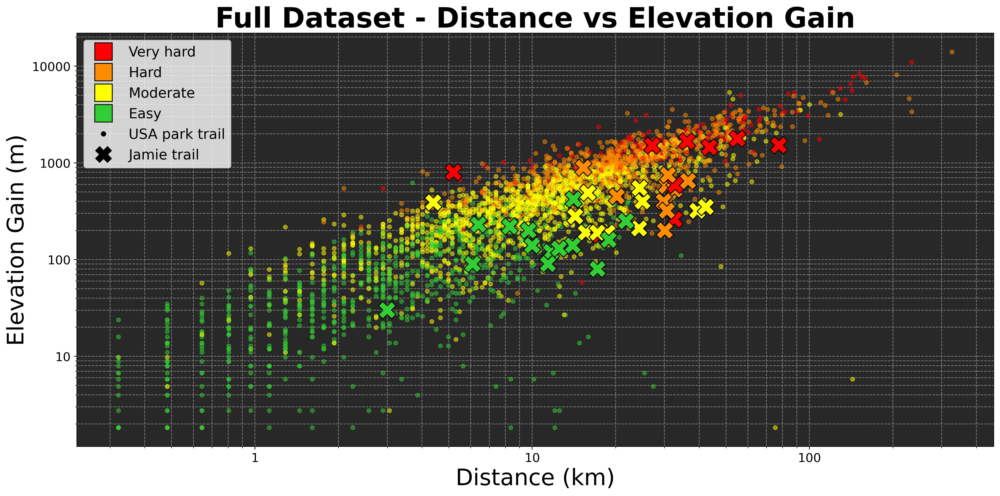

In [26]:
### Full Dataset - Distance vs Elevation Gain (with Difficulty, and Rating)

"""
Converts difficulty to its corresponding index in difficultyColors
"""
def difficultyColourIndex(trailDifficulty):
    return int((trailDifficulty - 1) / 2)

usaDist = usaTrails.distance
usaGain = usaTrails.elevation_gain
usaDifficulty = usaTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1).copy()

myDist = myCompletedTrails.distance
myGain = myCompletedTrails.elevation_gain
myDifficulty = myCompletedTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1).copy()

fig = plt.gcf()
ax = plt.gca()

title = 'Full Dataset - Distance vs Elevation Gain'
ax.set_title(title, size=titleSize, fontweight='bold')

# Legend
legend_elements = [
    Line2D([0], [0], marker='s', color='none', label='Very hard', markerfacecolor=difficultyColors[3], markersize=20),
    Line2D([0], [0], marker='s', color='none', label='Hard', markerfacecolor=difficultyColors[2], markersize=20),
    Line2D([0], [0], marker='s', color='none', label='Moderate', markerfacecolor=difficultyColors[1], markersize=20),
    Line2D([0], [0], marker='s', color='none', label='Easy', markerfacecolor=difficultyColors[0], markersize=20),
    Line2D([0], [0], marker='.', color='none', label='USA park trail', markerfacecolor='k', markersize=10),
    Line2D([0], [0], marker='X', color='none', label=f'{masterUser} trail', markerfacecolor='k', markersize=18)]
ax.legend(handles=legend_elements, facecolor=legendColor, prop={'size': legendTextSize})

plt.scatter(usaDist, usaGain, s=20, c=difficultyColors[usaDifficulty], marker='o', alpha=0.5, zorder=2)
plt.scatter(myDist,  myGain,  s=400, c=difficultyColors[myDifficulty], marker='X', edgecolors='k', zorder=3)

ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('Distance (km)', size=axisLabelSize)
plt.ylabel('Elevation Gain (m)', size=axisLabelSize)

ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
ax.xaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))

fig.set_dpi(DPI)
fig.patch.set_facecolor('w')
fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
plt.rcParams['axes.facecolor'] = backgroundColor
plt.tight_layout()
plt.grid(axis='both', which='both', ls='--', c='grey', zorder=0)

plt.savefig(f'images/{title.replace(" ", "")}')
plt.show()

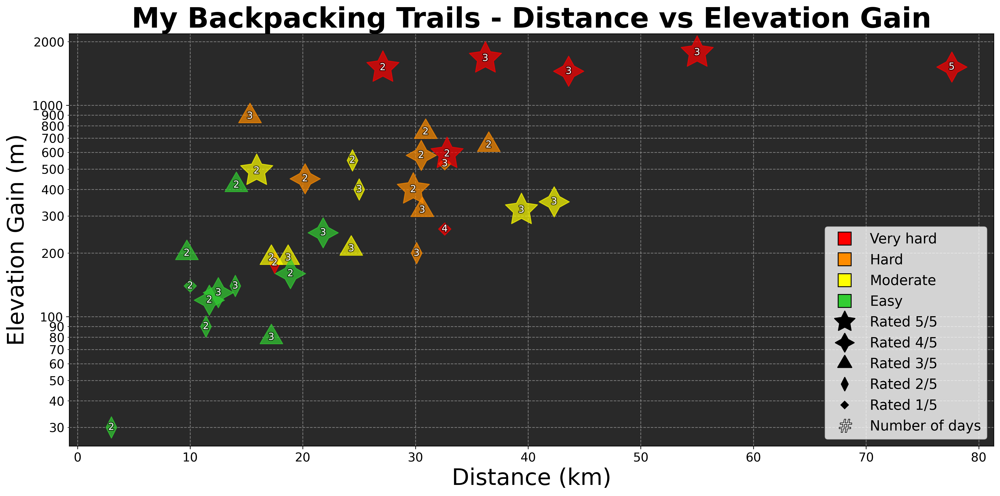

In [175]:
### My Backpacking Trails - Distance vs Elevation Gain (with Difficulty and Rating)

"""
Generates a plot of Distance vs Elevation Gain (with Difficulty and Rating)
"""
def distGainPlot(title,
                 xLabel,
                 ylabel,
                 dist,
                 gain,
                 rating,
                 difficulty,
                 annotations=[],
                 annotationLabel='Hike Number',
                 xLog=True,
                 savePlot=False):

    fig = plt.gcf()
    ax = plt.gca()
    ax.set_title(title, size=titleSize, fontweight='bold')

    markers = ['D', (2, 1, 0), (3, 1, 0), (4, 1, 0), (5, 1, 0)]
    markerSizes = [100, 600, 900, 1200, 1500]

    legendElements = [
        Line2D([0], [0], marker='s', c='none', label='Very hard', markerfacecolor=difficultyColors[3], markersize=15),
        Line2D([0], [0], marker='s', c='none', label='Hard', markerfacecolor=difficultyColors[2], markersize=15),
        Line2D([0], [0], marker='s', c='none', label='Moderate', markerfacecolor=difficultyColors[1], markersize=15),
        Line2D([0], [0], marker='s', c='none', label='Easy', markerfacecolor=difficultyColors[0], markersize=15),
        Line2D([0], [0], marker=markers[4], c='none', label='Rated 5/5', markerfacecolor='k', markersize=25),
        Line2D([0], [0], marker=markers[3], c='none', label='Rated 4/5', markerfacecolor='k', markersize=22),
        Line2D([0], [0], marker=markers[2], c='none', label='Rated 3/5', markerfacecolor='k', markersize=19),
        Line2D([0], [0], marker=markers[1], c='none', label='Rated 2/5', markerfacecolor='k', markersize=16),
        Line2D([0], [0], marker=markers[0], c='none', label='Rated 1/5', markerfacecolor='k', markersize=6)
    ]

    if len(annotations) > 0:
        legendElements.append(
            Line2D([0], [0], marker='$\#$', c='none', label=annotationLabel,
                   markerfacecolor='w', markersize=16, mew=0.67)
        )

    ax.legend(handles=legendElements, facecolor=legendColor, prop={'size': legendTextSize})

    shadowEffect = [path_effects.withStroke(linewidth=2, foreground='black', alpha=0.6)]

    if len(annotations) > 0:
        for _x, _y, _r, _c, _a in zip(dist, gain, rating, difficultyColors[difficulty], annotations):
            ratingIndex = int(round(_r) - 1)
            plt.scatter(_x, _y, s=markerSizes[ratingIndex], c=_c,
                        marker=markers[ratingIndex], alpha=0.7, zorder=2)
            annotation = ax.annotate(round(_a), (_x, _y), c='w', size=11, ha='center', va='center')
            annotation.set_path_effects(shadowEffect)
    else:
        for _x, _y, _r, _c in zip(dist, gain, rating, difficultyColors[difficulty]):
            ratingIndex = int(round(_r) - 1)
            plt.scatter(_x, _y, s=markerSizes[ratingIndex], c=_c,
                        marker=markers[ratingIndex], alpha=0.7, zorder=2)

    fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
    plt.rcParams['axes.facecolor'] = backgroundColor
    fig.set_dpi(DPI)

    ax.set_yscale('log')
    if xLog:
        ax.set_xscale('log')

    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(ylabel, size=axisLabelSize)
    plt.grid(axis='both', which='both', ls='--', c='grey', zorder=0)

    ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
    ax.xaxis.set_minor_formatter(mticker.ScalarFormatter())
    ax.xaxis.set_major_formatter(mticker.ScalarFormatter())
    ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.0f'))
    ax.yaxis.set_minor_formatter(mticker.FormatStrFormatter('%.0f'))

    fig.patch.set_facecolor('w')
    plt.tight_layout()

    if savePlot:
        plt.savefig(f'images/{title.replace(" ", "")}')

    plt.show()


# Generating Distance vs Elevation Gain plot for my completed trails
distCompleted = myCompletedBackpackingTrails.distance
gainCompleted = myCompletedBackpackingTrails.elevation_gain
ratingCompleted = myCompletedBackpackingTrails.rating
diffCompleted = myCompletedBackpackingTrails.apply(lambda trail: difficultyColourIndex(trail.difficulty), axis=1)
numDays = myCompletedBackpackingTrails.days

distGainPlot('My Backpacking Trails - Distance vs Elevation Gain',
             'Distance (km)',
             'Elevation Gain (m)',
             distCompleted,
             gainCompleted,
             ratingCompleted,
             diffCompleted,
             numDays,
             annotationLabel='Number of days',
             xLog=False,
             savePlot=True)

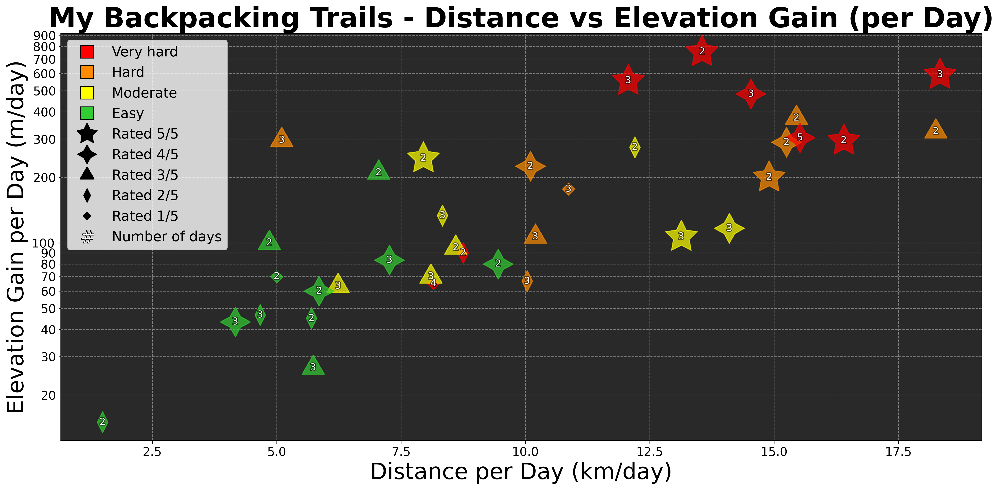

In [177]:
### My Backpacking Trails - Distance vs Elevation Gain Per Day (with Difficulty and Rating)

distPerDay = myCompletedBackpackingTrails.distance.divide(myCompletedBackpackingTrails.days)
gainPerDay = myCompletedBackpackingTrails.elevation_gain.divide(myCompletedBackpackingTrails.days)

distGainPlot('My Backpacking Trails - Distance vs Elevation Gain (per Day)', 
             'Distance per Day (km/day)',
             'Elevation Gain per Day (m/day)',
             distPerDay, 
             gainPerDay, 
             ratingCompleted,
             diffCompleted,
             numDays,
             annotationLabel = 'Number of days',
             xLog = False,
             savePlot = True)

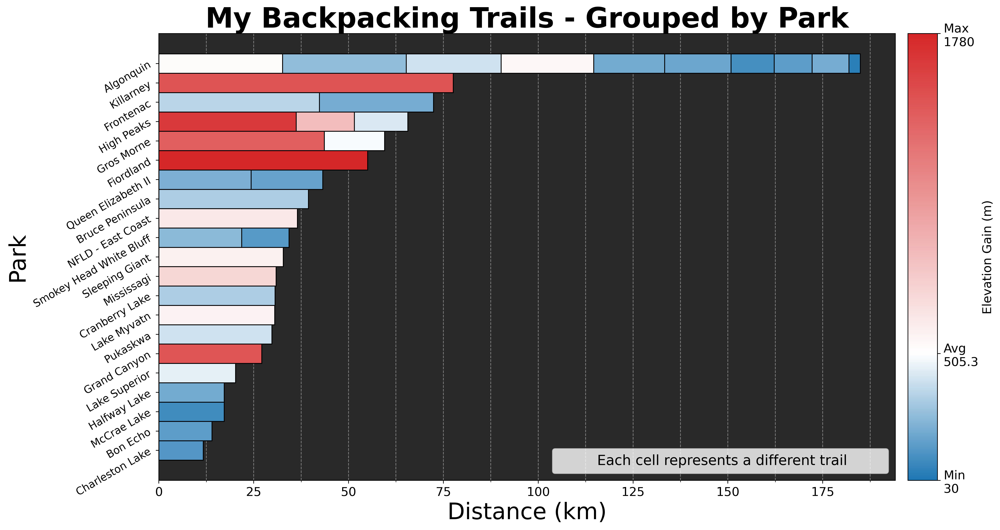

In [27]:
### My Backpacking Trails - Grouped by Park

"""
Determines which group to add the trail to and determines bar color
"""
def addTrailToBarStack(trail, barFeature, colorFeature, groups, groupBy, barValues, barColors):
    barStackIndex = groups.tolist().index(trail[groupBy])
    barStack = barValues[:, barStackIndex]
    
    # Fill the first empty slot
    for j, barValue in enumerate(barStack):
        if barValue == 0:
            barValues[j, barStackIndex] = trail[barFeature]
            barColors[j, barStackIndex] = trail[colorFeature]
            break


"""
No need for a space if there is no unit
"""
def setUnitSpace(hasSpace):
    if hasSpace == True:
        return ' '
    else:
        return ''

"""
Produces an decendeing coloured bar chart, grouped by a specified feature (groupBy)
Bar height is determined by an inputed feature (barFeature)
Bar colour is determined by another inputed feature (colorFeature)
"""
def stackedBarPlot(plotTitle, 
                   xLabel,
                   trails,
                   barFeature,
                   colorRange = hotColdColors,
                   colorFeature = None, # defaults to barFeature
                   colorLabel = '',
                   groupBy = 'park',
                   barThickness = 0.4,
                   savePlot = False):
    
    if colorFeature == None:
        colorFeature = barFeature 

    groups = trails[[groupBy, barFeature]].groupby(groupBy).sum().sort_values(barFeature, ascending=True)
    groups = groups.reset_index()[groupBy]
    
    numBarsStacked = trails[groupBy].value_counts()[0]
    barValues = np.zeros((numBarsStacked, len(groups)))
    barColors = np.zeros((numBarsStacked, len(groups)))

    sortedTrails = trails[[groupBy, barFeature, colorFeature]].sort_values([groupBy, barFeature], 
                                                                           ascending=[True, False])
    
    sortedTrails.apply(lambda trail: addTrailToBarStack(trail, barFeature, colorFeature, 
                                                        groups, groupBy, barValues, barColors), axis=1)
            
    # Setting up bar colors
    cRangeMax = sortedTrails[colorFeature].max()
    cRangeMin = sortedTrails[colorFeature].min()
    cAvg = sortedTrails[colorFeature].mean()
    colorList = [(0.0, colorRange[0]), 
                 (cAvg/cRangeMax, colorRange[1]), 
                 (1.0, colorRange[2])]
    cmap = mcolors.LinearSegmentedColormap.from_list('', colorList)
    barColors /= cRangeMax # Normalizing

    fig = plt.gcf()
    ax = plt.gca()

    for i in range(barValues.shape[0]):
        ax.barh(groups, 
                barValues[i], 
                left = np.sum(barValues[:i], axis = 0), 
                color=cmap(barColors[i]),
                edgecolor='k',
                height=1,
                zorder=2)
        
    legendElements = [Line2D([0], [0], marker='s', c='none', label='Each cell represents a different trail        ')]
    ax.legend(handles=legendElements, facecolor=legendColor, prop={'size': legendTextSize})
    
    ax.yaxis.set_major_locator(mticker.FixedLocator(range(len(groups))))
    ax.set_yticklabels(groups, rotation = 30, ha='right')
    ax.tick_params(axis='x', which='both', labelsize=tickLabelSize)
    ax.tick_params(axis='y', which='both', labelsize=12)
    ax.set_title(plotTitle, size=titleSize, fontweight='bold')

    ax.xaxis.grid(True, which='minor')
    ax.xaxis.set_minor_locator(AutoMinorLocator(2))
    
    plt.grid(axis='x', which='both', ls='--', c='grey', zorder=0)
    plt.grid(axis='y', which='both', ls='none')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(groupBy.capitalize(), size=axisLabelSize)
    fig.set_size_inches(standardCanvasWidth, 1.6 + len(groups)*barThickness)
    fig.set_dpi(DPI)
    fig.patch.set_facecolor('w')
    plt.rcParams['axes.facecolor'] = backgroundColor
    
    # Setting colorbar
    sm = cm.ScalarMappable(cmap=cmap)
    tick_locs = np.asarray(np.asarray(colorList)[:,0], dtype='float')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='4%', pad=0.2)
    cbar = plt.colorbar(sm, orientation='vertical', ticks=tick_locs, cax=cax)
    cbar.set_label(colorLabel, size=tickLabelSize)
    cbar.ax.tick_params(labelsize=tickLabelSize)
    cbar.set_ticklabels([f'Min\n{round(cRangeMin, 1)}',
                         f'Avg\n{round(cAvg, 1)}',
                         f'Max\n{round(cRangeMax, 1)}'])
    plt.tight_layout()
    
    if savePlot == True:
        plt.savefig(f'images/{plotTitle.replace(" ", "")}', bbox_inches='tight')
    plt.show()

stackedBarPlot(plotTitle = 'My Backpacking Trails - Grouped by Park', 
               xLabel = 'Distance (km)',
               trails = myCompletedBackpackingTrails,
               barFeature = 'distance',
               colorFeature = 'elevation_gain',
               colorLabel = 'Elevation Gain (m)',
               groupBy = 'park',
               barThickness = 0.33,
               savePlot = True)

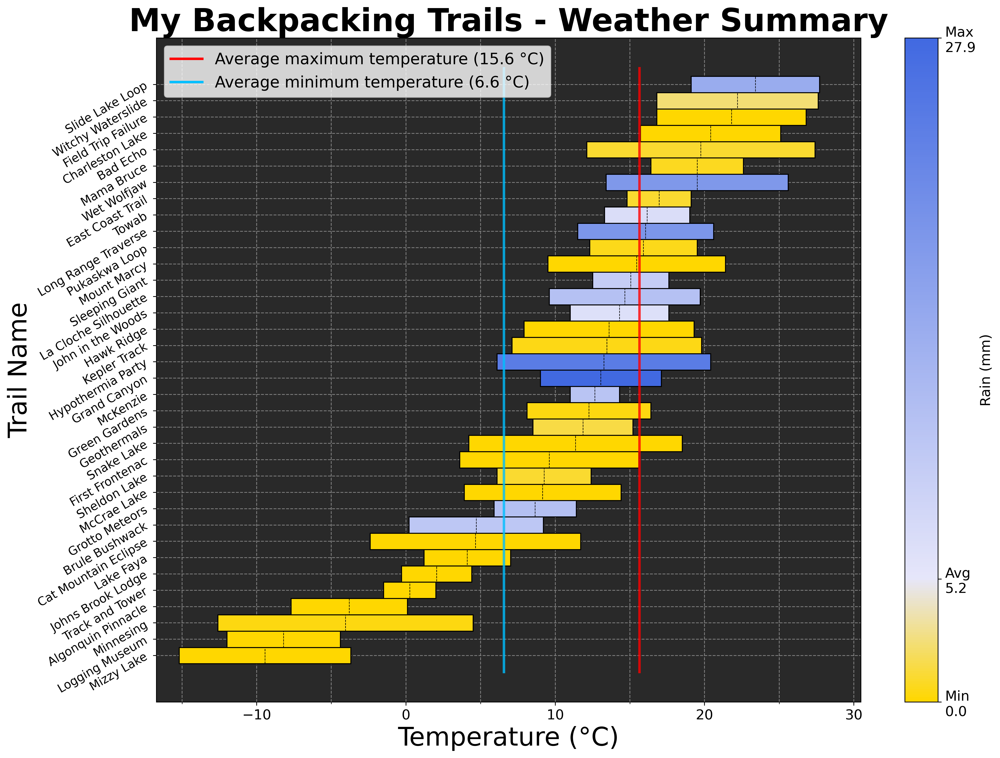

In [28]:
### My Backpacking Trails - Weather Summary

"""
Produces a descending coloured bar chart sorted by `sortBy`.
Bar height is determined by `barTop`.
`barBottom` determines the starting position of the bar (useful for ranges).
Bar colour is determined by another inputted feature (`colorCol`).
"""
def colorBarPlot(plotTitle,
                 xLabel,
                 trails,
                 barUnits,
                 barTop,
                 barTopLabel,
                 colorRange,
                 colorMinMax=None,
                 barBottom=0,
                 barBottomLabel='',
                 barUnitSpace=True,
                 colorCol=None,  # defaults to barTop
                 colorLabel='',
                 yTicks='name',
                 yLabel='Trail Name',
                 xBounds=None,
                 legendLocation='upper right',
                 sortBy=None,  # defaults to barTop
                 barThickness=0.3,
                 savePlot=False):
    
    if colorCol is None:
        colorCol = barTop
    if sortBy is None:
        sortBy = barTop

    BUS = setUnitSpace(barUnitSpace)
    avgTop = trails[barTop].mean()
    numBarTrails = len(trails)

    fig = plt.gcf()
    ax = plt.gca()

    ax.set_title(plotTitle, size=titleSize, fontweight='bold')
    plt.xlabel(xLabel, size=axisLabelSize)
    plt.ylabel(yLabel, size=axisLabelSize)

    trails = trails.sort_values(by=[sortBy], ascending=True)

    ax.yaxis.set_major_locator(mticker.FixedLocator(range(len(trails[yTicks]))))
    ax.set_yticklabels(trails[yTicks], rotation=30, ha='right')

    fig.set_size_inches(standardCanvasWidth, 1.6 + len(trails) * barThickness)
    ax.xaxis.grid(True, which='minor')
    ax.xaxis.set_minor_locator(AutoMinorLocator(2))
    ax.tick_params(axis='y', which='major', labelsize=12)
    ax.tick_params(axis='x', which='both', labelsize=tickLabelSize)

    plt.rcParams['axes.facecolor'] = backgroundColor
    fig.set_dpi(DPI)

    # Handle bar bottom input (can be int or column)
    bottomIsInt = isinstance(barBottom, int)
    if bottomIsInt:
        barBottoms = [barBottom] * numBarTrails
        plt.grid(axis='x', which='both', ls='--', c='grey', zorder=0)
        plt.grid(axis='y', which='both', ls='none')
        topAvgColor = 'mediumpurple'
    else:
        barBottoms = trails[barBottom]
        plt.grid(axis='both', which='both', ls='--', c='grey', zorder=0)
        avgBottom = trails[barBottom].mean()
        barBtmLabel = f'Average {barBottomLabel} ({round(avgBottom, 1)}{BUS + barUnits})'
        topAvgColor = 'red'

    # Averages + legend
    averagesLS = '-'
    averagesLW = 2.5
    bottomAvgColor = 'deepskyblue'
    barTopLabel = f'Average {barTopLabel} ({round(avgTop, 1)}{BUS + barUnits})'

    ax.plot([avgTop, avgTop], [-1, numBarTrails], topAvgColor,
            lw=averagesLW, ls=averagesLS, zorder=4, alpha=0.8)

    legend_elements = [
        Line2D([0], [0], color=topAvgColor, ls=averagesLS, lw=averagesLW, label=barTopLabel)
    ]

    if not bottomIsInt:
        ax.plot([avgBottom, avgBottom], [-1, numBarTrails], c=bottomAvgColor,
                lw=averagesLW, ls=averagesLS, zorder=4, alpha=0.8)
        legend_elements.append(
            Line2D([0], [0], color=bottomAvgColor, ls=averagesLS, lw=averagesLW, label=barBtmLabel)
        )

    plt.legend(facecolor=legendColor, prop={'size': legendTextSize},
               handles=legend_elements, loc=legendLocation)

    # Bar values and limits
    barTops = trails[barTop] - barBottoms
    if xBounds is None:
        plt.xlim(np.min(barBottoms) * 1.1, np.max(trails[barTop]) * 1.1)
    else:
        plt.xlim(xBounds[0], xBounds[1])

    # Set up color mapping
    colorValues = trails[colorCol]
    
    if colorMinMax is None:
        cRangeMin = colorValues.min()
        cRangeMax = colorValues.max()
    else:
        cRangeMin = colorMinMax[0]
        cRangeMax = colorMinMax[1]
        
    cAvg = colorValues.mean()
    colorList = [
        (0.0, colorRange[0]),
        ((cAvg - cRangeMin) / (cRangeMax - cRangeMin), colorRange[1]),
        (1.0, colorRange[2])
    ]
    cmap = mcolors.LinearSegmentedColormap.from_list('', colorList)

    # Colorbar
    sm = cm.ScalarMappable(cmap=cmap)
    tick_locs = np.asarray([x[0] for x in colorList], dtype='float')
    cbar = plt.colorbar(sm, orientation='vertical', ticks=tick_locs, ax=ax)
    cbar.set_label(colorLabel, size=tickLabelSize)
    cbar.ax.tick_params(labelsize=tickLabelSize)
    cbar.set_ticklabels([
        f'Min\n{round(cRangeMin, 1)}',
        f'Avg\n{round(cAvg, 1)}',
        f'Max\n{round(cRangeMax, 1)}'
    ])

    plt.barh(
        trails[yTicks],
        barTops,
        left=barBottoms,
        color=cmap(((colorValues - cRangeMin) / (cRangeMax - cRangeMin)).astype('float')),
        height=1,
        edgecolor='k',
        zorder=2
    )

    # Optional secondary line plot for sortBy != barTop
    if sortBy != barTop:
        stepY = (np.array(range(numBarTrails)) - 0.5).tolist()
        stepY.append(stepY[-1] + 1)
        stepX = ((trails[barTop] + barBottoms) / 2).tolist()
        stepX.append(stepX[-1])
        ax.step(stepX, stepY, c='k', where='pre', ls='--', lw=0.6, zorder=3)

    fig.patch.set_facecolor('w')

    if savePlot:
        plt.savefig(f'images/{plotTitle.replace(" ", "")}', bbox_inches='tight')

    plt.show()
    
colorBarPlot(plotTitle = 'My Backpacking Trails - Weather Summary',
             xLabel = 'Temperature (°C)',
             trails = myCompletedBackpackingTrails,
             barUnits = '°C',
             barTop = 'max_temp',
             barTopLabel = 'maximum temperature',
             barBottom = 'min_temp',
             barBottomLabel = 'minimum temperature',
             colorRange = ['gold', 'lavender', 'royalblue'],
             colorCol = 'rain',
             colorLabel = 'Rain (mm)',
             legendLocation = 'upper left',
             sortBy = 'avg_temp',
             barThickness = 0.3,
             savePlot = True)

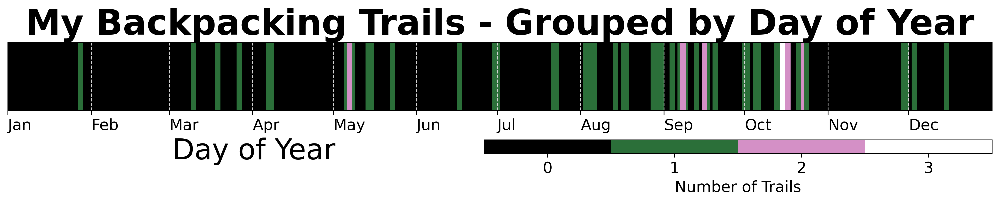

In [73]:
### My Backpacking Trails - Grouped by Day of Year

"""
Adds a trail's date range to the counts list (length 366),
where each element of counts represents a day of the year.
Accounts for leap years by offsetting post-February dates.
"""
def addTrailToCounts(trail, counts):
    trailDateRange = pd.date_range(trail.start_date, trail.end_date, freq='d')
    
    for trailDate in trailDateRange:
        if not calendar.isleap(trailDate.year) and trailDate.month > 2:
            counts[trailDate.timetuple().tm_yday] += 1
        else:
            counts[trailDate.timetuple().tm_yday - 1] += 1

trailCounts = np.zeros(366)
myCompletedBackpackingTrails.apply(lambda trail: addTrailToCounts(trail, trailCounts), axis=1)

# Create a list of 366 dates in a leap year (ensures Feb 29 exists)
leapYear = dt.datetime(2020, 1, 1)  # Arbitrary leap year
periods = [leapYear + dt.timedelta(days=i) for i in range(366)]

cmap = plt.get_cmap('cubehelix', trailCounts.max() + 1)

fig = plt.figure(figsize=(standardCanvasWidth, standardCanvasHeight / 7))
fig.set_dpi(DPI)
ax = plt.gca()

ax.bar(periods, 1, align='edge', width=1, linewidth=0, color=cmap(trailCounts / trailCounts.max()), zorder=0)

# Formatting x-axis with months
ax.xaxis.set_major_locator(MonthLocator())
ax.xaxis.set_major_formatter(DateFormatter('%b'))
ax.set_xlim(periods[0], periods[-1] + dt.timedelta(hours=23))
for label in ax.xaxis.get_ticklabels():
    label.set_horizontalalignment('left')
ax.xaxis.set_tick_params(labelsize=tickLabelSize)

plt.grid(axis='x', which='both', ls='--', c='lightgrey', zorder=1)
title = 'My Backpacking Trails - Grouped by Day of Year'
ax.set_title(title, size=titleSize, fontweight='bold')
ax.set_xlabel('Day of Year', size=axisLabelSize, x=0.25)
plt.yticks([])
plt.ylim(0, 1)

# Colorbar setup
sm = cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, max(trailCounts)))
n_clusters = max(trailCounts) + 1
tick_locs = (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters
cbar = plt.colorbar(
    sm, orientation='horizontal',
    cax=fig.add_axes([0.5, -0.35, 0.4, 0.15])
)
cbar.set_label('Number of Trails', size=tickLabelSize)
cbar.set_ticks(tick_locs)
cbar.ax.tick_params(labelsize=tickLabelSize)
cbar.set_ticklabels(range(int(n_clusters)))
cbar.outline.set_edgecolor('black')
cbar.outline.set_linewidth(0.8)

fig.patch.set_facecolor('w')
plt.savefig(f'images/{title.replace(" ", "")}', bbox_inches='tight')
plt.show()

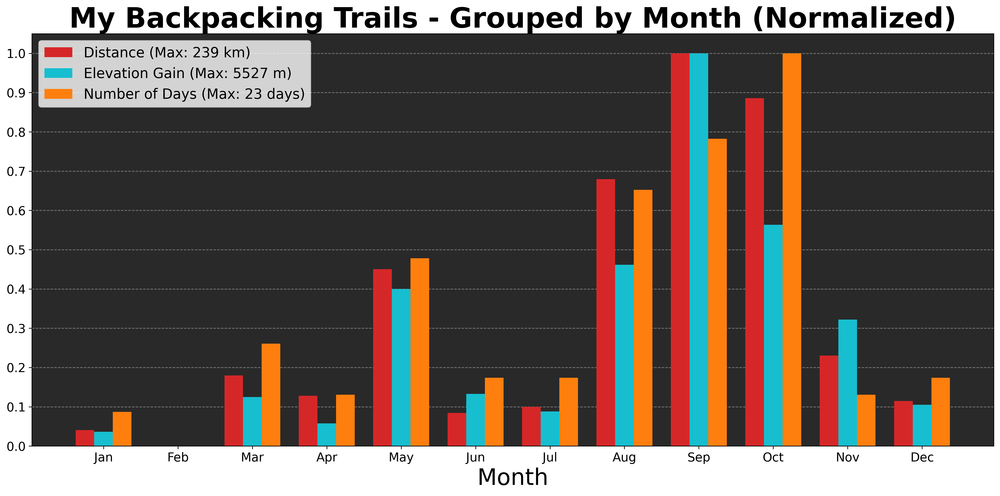

In [ ]:
### My Backpacking Trails - Grouped by Month (Normalized)

"""
Adds a trail feature to a given month (in barValues).
If a trail spans multiple months, divides the feature evenly over its days.
"""
def addTrailToMonth(trail, feature, barValues):
    trailDateRange = pd.date_range(trail.start_date, trail.end_date, freq='d')
    for trailDate in trailDateRange:
        barValues[trailDate.month - 1] += trail[feature] / trail.days

"""
Generates a plot of trail features grouped by month, normalized within each feature.
"""
def summaryByMonthPlot(plotTitle, trails, legendLabels, units, features, colors):
    fig = plt.gcf()
    ax = plt.gca()
    periods = np.arange(12)
    barsPerMonth = len(features)
    barWidth = 1/(1 + barsPerMonth)
    
    for featureIndex, feature in enumerate(features):
        barValues = np.zeros(12)
        trails.apply(lambda trail: addTrailToMonth(trail, feature, barValues), axis=1)
        
        # Calculate bar positions to align side-by-side
        if featureIndex == 0:
            position = -(barsPerMonth - 1)*barWidth/2
        else:
            position += barWidth

        ax.bar(periods + position,
               barValues / barValues.max(),  # Normalizing
               width=barWidth,
               linewidth=0,
               color=colors[featureIndex],
               label=f'{legendLabels[featureIndex]} (Max: {round(barValues.max())} {units[featureIndex]})',
               zorder=2)

    fig.set_size_inches(standardCanvasWidth, standardCanvasHeight)
    fig.set_dpi(DPI)
    ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
    plt.grid(axis='y', which='both', linestyle='--', color='grey', zorder=0)
    plt.grid(axis='x', which='both', linestyle='none')
    plt.xticks(periods, months)
    plt.locator_params(axis='y', nbins=11)

    ax.set_title(plotTitle, size=titleSize, fontweight='bold')
    ax.set_xlabel('Month', size=axisLabelSize)
    plt.legend(facecolor=legendColor, prop={'size': legendTextSize})
    
    fig.patch.set_facecolor('w')
    plt.rcParams['axes.facecolor'] = backgroundColor
    plt.tight_layout()
    plt.savefig(f'images/{plotTitle.replace(" ", "")}')
    plt.show()

summaryByMonthPlot(plotTitle = 'My Backpacking Trails - Grouped by Month (Normalized)', 
                   trails = myCompletedBackpackingTrails,
                   features = ['distance', 'elevation_gain', 'days'],
                   colors = ['tab:red', 'tab:cyan', 'tab:orange'],
                   legendLabels = ['Distance', 'Elevation Gain', 'Number of Days'],
                   units = ['km', 'm', 'days'])

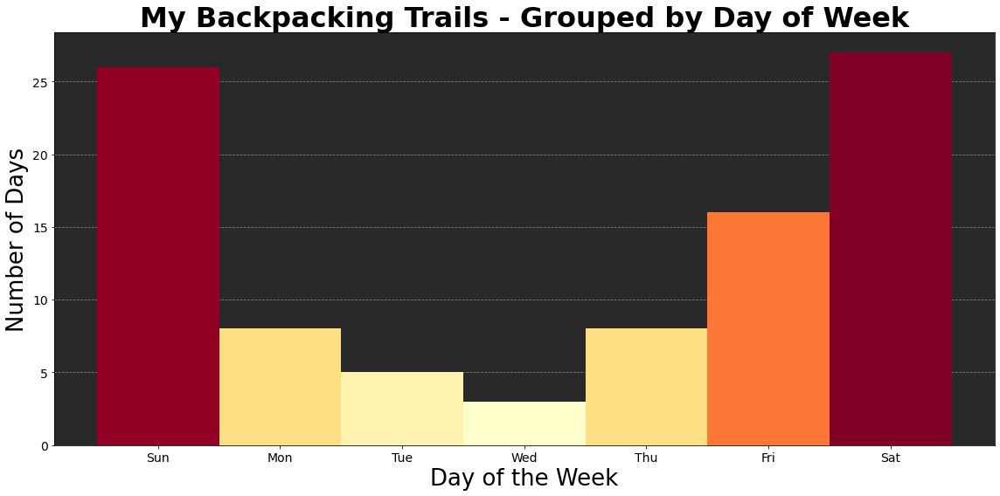

In [181]:
### My Backpacking Trails - Grouped by Day of Week

# Generate a list of all hiking days across all backpacking trails
dayOccurrences = pd.concat([
    pd.Series(pd.date_range(start, end))
    for start, end in zip(myCompletedBackpackingTrails['start_date'], 
                          myCompletedBackpackingTrails['end_date'])
]).dt.day_name()

# Count occurrences by day of week and rename to abbreviations
dayCounts = dayOccurrences.value_counts().reindex(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'])
dayCounts.index = dayCounts.index.map({
    'Sunday': 'Sun', 'Monday': 'Mon', 'Tuesday': 'Tue','Wednesday': 'Wed', 'Thursday': 'Thu', 'Friday': 'Fri', 'Saturday': 'Sat'
})

# Normalize for colormap
norm = Normalize(vmin=dayCounts.min(), vmax=dayCounts.max())
cmap = cm.YlOrRd

plt.figure(figsize=(standardCanvasWidth, standardCanvasHeight))
bars = plt.bar(dayCounts.index,
               dayCounts.values,
               color=cmap(norm(dayCounts.values)),
               width=1,
               zorder=2)

plt.title('My Backpacking Trails - Grouped by Day of Week', size=titleSize, fontweight='bold')
plt.xlabel('Day of the Week', size=axisLabelSize)
plt.ylabel('Number of Days', size=axisLabelSize)
plt.xticks(size=tickLabelSize)
plt.yticks(size=tickLabelSize)
plt.grid(axis='y', which='both', linestyle='--', color='grey', zorder=0)
plt.grid(axis='x', which='both', linestyle='none')

fig = plt.gcf()
fig.patch.set_facecolor('w')
plt.tight_layout()
plt.savefig('images/MyBackpackingTrails-GroupedByDayOfWeek')
plt.show()

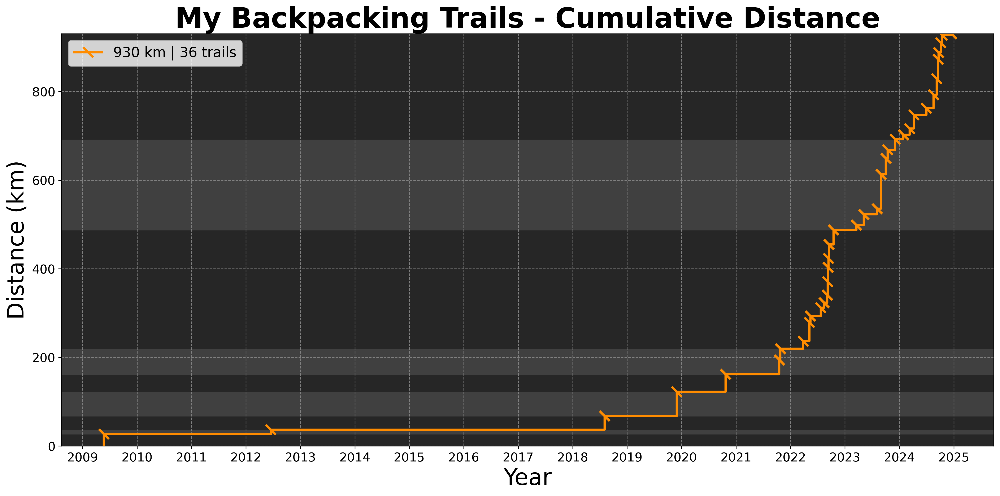

In [182]:
### My Backpacking Trails - Cumulative Distance

# Create cumulative distance and matching end-date axis
distCum = pd.concat([pd.Series([0]), myCompletedBackpackingTrails['distance'].cumsum()])
xDates = pd.concat([
    pd.Series([myCompletedBackpackingTrails['end_date'].iloc[0]]),
    myCompletedBackpackingTrails['end_date']
])

fig, ax = plt.subplots(figsize=(standardCanvasWidth, standardCanvasHeight), dpi=DPI)
title = 'My Backpacking Trails - Cumulative Distance'
ax.set_title(title, size=titleSize, fontweight='bold')

plt.step(xDates, distCum,
         where='post',
         linewidth=2.5,
         markevery=(1, 1),
         marker=(2, 2, 45),
         markersize=16,
         mew=2.5,
         color='darkorange',
         zorder=2,
         label=f'{round(myCompletedBackpackingTrails["distance"].sum())} km | {len(myCompletedBackpackingTrails)} trails')

# Add alternating year background spans
years = xDates.apply(lambda date: date.year).tolist()
distinctYears = [years[0]]
calendarYearBarRollingValue = 0

for i, (year, dist) in enumerate(zip(years, distCum)):
    nextYear = years[i+1] if i + 1 < len(years) else None

    if len(distinctYears) % 2 == 0:
        shadeColor = '0.25'
    else:
        shadeColor = '0.15'

    if nextYear and nextYear not in distinctYears:
        ax.axhspan(calendarYearBarRollingValue, dist, facecolor=shadeColor, edgecolor=shadeColor, zorder=0)
        calendarYearBarRollingValue = dist
        distinctYears.append(nextYear)
    elif i == len(years) - 1:
        ax.axhspan(calendarYearBarRollingValue, dist, facecolor=shadeColor, edgecolor=shadeColor, zorder=0)

ax.set_ylim(0, distCum.max())
ax.set_xlabel('Year', size=axisLabelSize)
ax.set_ylabel('Distance (km)', size=axisLabelSize)
ax.xaxis.set_major_locator(YearLocator())
ax.xaxis.set_major_formatter(DateFormatter('%Y'))
ax.tick_params(axis='both', which='both', labelsize=tickLabelSize)
ax.grid(axis='both', which='both', linestyle='--', color='grey', zorder=1)

plt.legend(facecolor=legendColor, prop={'size': legendTextSize}, loc='upper left')
plt.rcParams['axes.facecolor'] = backgroundColor
fig.patch.set_facecolor('w')
plt.tight_layout()
plt.savefig(f'images/{title.replace(" ", "")}')
plt.show()

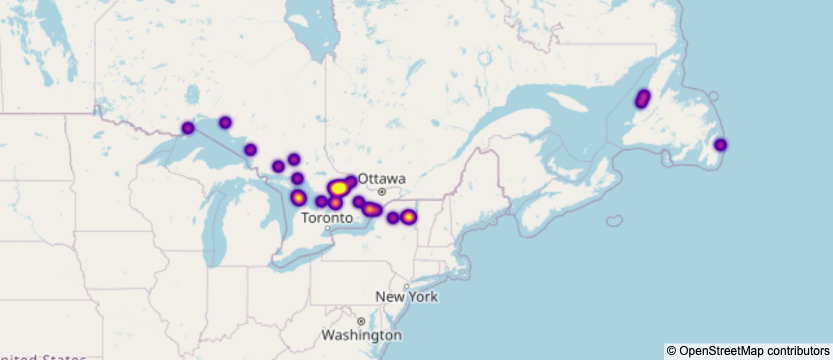

In [185]:
### Trail Locations on Map

fig = px.density_mapbox(myCompletedBackpackingTrails, 
                        lat='lat', lon='lng', radius=10, 
                        center=dict(lat=46.5, lon=278), zoom=4.8, 
                        mapbox_style='open-street-map')

fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})
fig.update(layout_coloraxis_showscale=False)
fig.show()

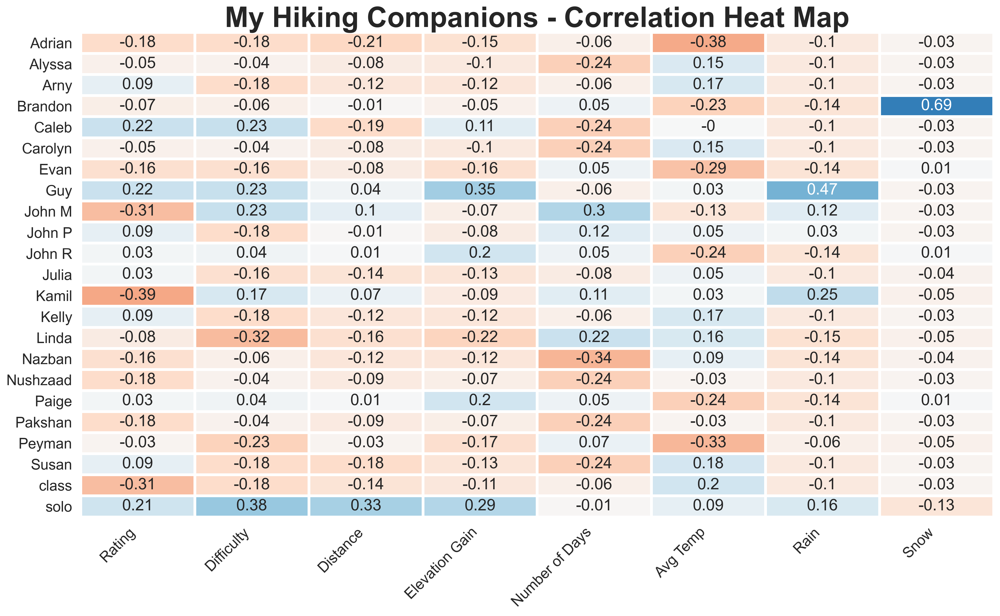

In [206]:
### My Completed Trails - Correlation Heat Map

"""
Generates correlation heat map for the given columns.
"""
def corrHeatMap(titleStart, 
                trails, 
                xCols,
                yCols = [],
                xLabels = '',
                yLabels = '',
                canvasHeight = standardCanvasHeight,
                save = True):
    
    # Setting defaults
    if len(yCols) == 0:
        yCols = xCols
        
    if xLabels == '':
        xLabels = xCols
        
    if yLabels == '':
        if xCols != yCols:
            yLabels = yCols
        else:
            yLabels = xLabels
    
    if xCols != yCols:
        trails = trails[xCols + yCols]
    else:
        trails = trails[xCols]
        
    corr = trails.corr().round(2)
    
    if xCols != yCols:
        corr = corr.drop(yCols, axis=1)
        corr = corr.drop(xCols, axis=0)
        
    sns.set(rc={'figure.figsize':(standardCanvasWidth, canvasHeight)})
    sns.set(font_scale = 1.5)
    heatmap = sns.heatmap(corr, annot=True, vmin=-1, vmax=1, center= 0, cmap='RdBu', linewidths=3, cbar=False)
    
    fig = plt.gcf()
    ax = plt.gca()
    
    fig.set_dpi(DPI)
    ax.set_xticklabels(xLabels, rotation = 45, ha='right')
    ax.set_yticklabels(yLabels)
    title = f'{titleStart} - Correlation Heat Map'
    ax.set_title(title, size=titleSize, fontweight='bold')
    fig.patch.set_facecolor('w')
    plt.tight_layout()
    
    if save:
        plt.savefig(f'images/{title.replace(" ", "")}')
        
    plt.show()

corrHeatMap('My Hiking Companions', 
            myCompletedTrails, 
            ['rating', 'difficulty', 'distance', 'elevation_gain', 'days', 'avg_temp', 'rain', 'snow'],
            companions + ['solo'],
            ['Rating', 'Difficulty', 'Distance', 'Elevation Gain', 'Number of Days', 'Avg Temp', 'Rain', 'Snow'],
            canvasHeight = 10,
            save = False)


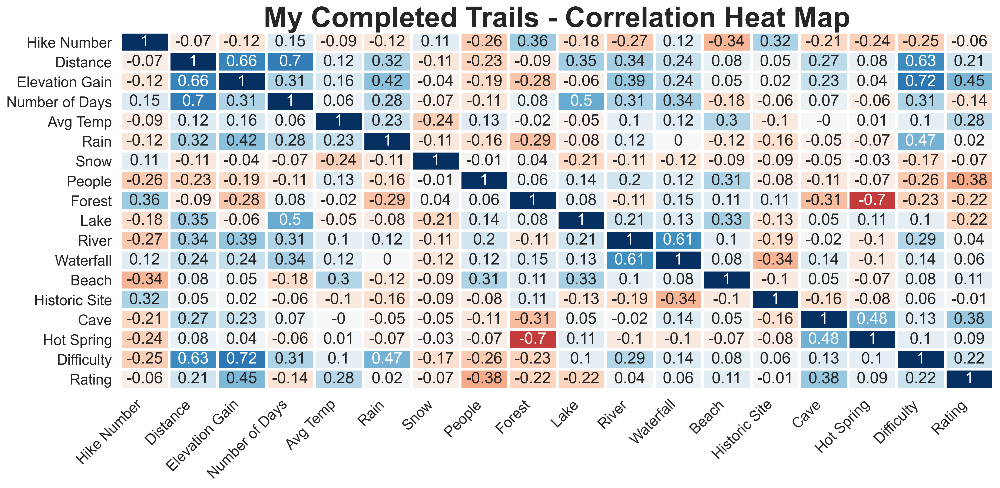

In [207]:
### My Completed Trails - Correlation Heat Map

myHeatMapColumns = ['order','distance','elevation_gain','days','avg_temp','rain','snow', 'num_people', 'forest',
                    'lake','river','waterfall','beach','historic_site','cave','hot_spring','difficulty','rating']

myHeatMapLabels = ['Hike Number','Distance','Elevation Gain','Number of Days','Avg Temp','Rain','Snow', 'People','Forest',
                   'Lake','River','Waterfall','Beach','Historic Site','Cave','Hot Spring','Difficulty','Rating']

corrHeatMap('My Completed Trails', 
            myCompletedTrails, 
            myHeatMapColumns, 
            xLabels = myHeatMapLabels)

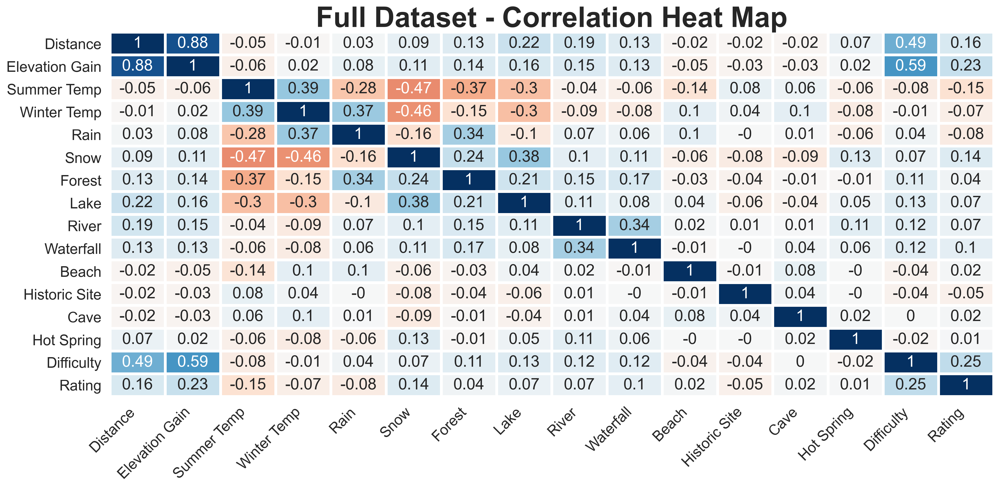

In [205]:
### Full Dataset - Correlation Heat Map

fullHeatMapColumns = ['distance','elevation_gain','summer_temp','winter_temp','annual_rain','annual_snow', 'forest',
                      'lake','river','waterfall','beach','historic_site','cave','hot_spring','difficulty','rating']

fullHeatMapLabels = ['Distance','Elevation Gain','Summer Temp','Winter Temp','Rain','Snow','Forest',
                     'Lake','River','Waterfall','Beach','Historic Site','Cave','Hot Spring','Difficulty','Rating']

corrHeatMap('Full Dataset', 
            trainingTrails, 
            fullHeatMapColumns, 
            xLabels = fullHeatMapLabels)

<b><font size="3">Training Difficulty Model</font></b>

In [29]:
### Setting Up Dataframe For Training

# The columns used to estimate difficulty and rating
xCols = ['distance', 'elevation_gain', # Movement
         'park', 'region', 'province', 'country', # Location
         'summer_temp', 'winter_temp', 'annual_rain', 'annual_snow', # Climate
         'forest', 'lake', 'river', 'waterfall', 'beach', 'historic_site', 'cave', 'hot_spring', # Trail features
         'backpacking', 'num_reviews', 'route_type', 'route_source', 'user'] # Misc

trainingTrailsXCols = trainingTrails[xCols]
trainingTrailsDifficulty = trainingTrails.difficulty
trainingTrailsRating = trainingTrails.rating

# TODO Make sure user is masterUser
uncompletedTrailsXCols = uncompletedTrails[xCols]

# Needed to normalize data before training and predicting later
numericTrainingData = trainingTrailsXCols.select_dtypes(include=[float, int])
numericTrainingDataMax = numericTrainingData.max()
numericTrainingDataMin = numericTrainingData.min()

In [30]:
### Setting Up Transformer for Categorical Features

"""
Adds a prefix to a word, used to make values in a categorical column distinct from other columns.
"""
def addPrefix(word, prefix):
    return f'{prefix}_{word}'

"""
Makes categorical columns distinct by applying column name as prefix.
"""
def makeCategoriesUnique(trails):
    
    transformedTrails = trails.copy()
    
    transformedTrails['user'] = transformedTrails.user.apply(addPrefix, prefix='user')
    transformedTrails['route_source'] = transformedTrails.user.apply(addPrefix, prefix='route_source')
    transformedTrails['route_type'] = transformedTrails.user.apply(addPrefix, prefix='route_type')
    transformedTrails['park'] = transformedTrails.park.apply(addPrefix, prefix='park')
    transformedTrails['region'] = transformedTrails.region.apply(addPrefix, prefix='region')
    transformedTrails['province'] = transformedTrails.province.apply(addPrefix, prefix='province')
    transformedTrails['country'] = transformedTrails.country.apply(addPrefix, prefix='country')
    
    return transformedTrails

"""
If the input column is numeric, it will be normalized relative to the training dataset.
"""
def normalizeNumericColumn(col):
    colName = col.name
    if colName in numericTrainingDataMin.index:
        maxValue = numericTrainingDataMax[colName]
        minValue = numericTrainingDataMin[colName]
        
        return (col - minValue)/(maxValue - minValue)
    
    else:
        return col

"""
Gives one hot transformed trails, optionally normalized.
"""
def convertTrailsForModel(trails, normalize=True):
    transformedTrails = makeCategoriesUnique(trails)    
    transformedTrails = transformedTrails[xCols] # Filtering columns
    
    if normalize:
        transformedTrails = transformedTrails.apply(normalizeNumericColumn)
                    
    transformedTrails = transformer.fit_transform(transformedTrails)     

    return transformedTrails

trainingTrailsXCols = makeCategoriesUnique(trainingTrailsXCols)

# Catagorical column encoding
oneHot = OneHotEncoder(handle_unknown='ignore',
                        categories=[trainingTrailsXCols.user.unique(),
                                    trainingTrailsXCols.route_source.unique(),
                                    trainingTrailsXCols.route_type.unique(),
                                    trainingTrailsXCols.park.unique(),
                                    trainingTrailsXCols.region.unique(),
                                    trainingTrailsXCols.province.unique(),
                                    trainingTrailsXCols.country.unique()])

transformer = ColumnTransformer([('one_hot', oneHot, ['user',
                                                      'route_source',
                                                      'route_type',
                                                      'park',
                                                      'region',
                                                      'province',
                                                      'country'])], remainder='passthrough')

In [27]:
### Finding Best Difficulty Estimator

"""
Returns the score for a given model.
"""
def testEstimator(model, modelStr, XTrain, XTest, yTrain, yTest):
    model.fit(XTrain, yTrain)
    print(f'{modelStr}: {round(model.score(XTest, yTest), 3)}')

"""
Tests 8 different regressors to find the best one to cross validate.
"""
def findBestEstimator(X_train, X_test, y_train, y_test, description, norm):
    
    NOT = ''
    if not norm:
        NOT = 'NOT '
        
    print(f'{description} MODEL SCORES (TRAINING DATA {NOT}NORMALIZED):'.upper())
    
    testEstimator(LinearRegression(), 'LinearRegression', X_train, X_test, y_train, y_test)
    testEstimator(Lasso(), 'Lasso', X_train, X_test, y_train, y_test)
    testEstimator(ElasticNet(), 'ElasticNet', X_train, X_test, y_train, y_test)
    testEstimator(Ridge(), 'Ridge', X_train, X_test, y_train, y_test)
    testEstimator(SVR(kernel='rbf'), 'SVR', X_train, X_test, y_train, y_test)
    testEstimator(RandomForestRegressor(), 'RandomForestRegressor', X_train, X_test, y_train, y_test)
    testEstimator(GradientBoostingRegressor(), 'GradientBoostingRegressor', X_train, X_test, y_train, y_test)
    testEstimator(BaggingRegressor(), 'BaggingRegressor', X_train, X_test, y_train, y_test)

"""
Tests 8 regressors using normalized values then using unchanged values.
"""
def compareNormVsNotNorm(transformedTrails, transformedTrailsNorm, target, description):
        
    X_train, X_test, y_train, y_test = train_test_split(transformedTrails, target, test_size=0.2)
    findBestEstimator(X_train, X_test, y_train, y_test, description, norm=False)
    print('\n')
    
    X_trainNorm, X_testNorm, y_trainNorm, y_testNorm = train_test_split(transformedTrailsNorm, target, test_size=0.2)
    findBestEstimator(X_trainNorm, X_testNorm, y_trainNorm, y_testNorm, description, norm=True)
    
transformedTrails = convertTrailsForModel(trainingTrailsXCols, normalize = False)
transformedTrailsNorm = convertTrailsForModel(trainingTrailsXCols, normalize = True)    
    
compareNormVsNotNorm(transformedTrails, transformedTrailsNorm, trainingTrailsDifficulty, 'difficulty')

DIFFICULTY MODEL SCORES (TRAINING DATA NOT NORMALIZED):
LinearRegression: 0.434
Lasso: 0.391
ElasticNet: 0.391
Ridge: 0.391
SVR: 0.594
RandomForestRegressor: 0.592
GradientBoostingRegressor: 0.62
BaggingRegressor: 0.592


DIFFICULTY MODEL SCORES (TRAINING DATA NORMALIZED):
LinearRegression: 0.403
Lasso: -0.002
ElasticNet: -0.002
Ridge: 0.386
SVR: 0.364
RandomForestRegressor: 0.617
GradientBoostingRegressor: 0.635
BaggingRegressor: 0.58


In [32]:
### Cross Validation for Difficulty

# For GradientBoostingRegressor cross validation
cvGrid_GBR = {'n_estimators': [100, 200],
              'learning_rate': [0.05, 0.1, 0.2],
              'max_depth': [3, 4, 5],
              'subsample': [0.8, 1.0],
              'min_samples_split': [2, 5]}

# For RandomForestRegressor cross validation
cvGrid_RFR = {'n_estimators': [100, 200],
              'max_depth': [None, 10, 20],
              'min_samples_split': [2, 5],
              'min_samples_leaf': [1, 2],
              'max_features': ['auto', 'sqrt']}

# Use Normalized or Not-Normalized values based on above result
# X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(transformedTrails, trainingTrailsDifficulty, test_size=0.2) # Not normalized
X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(transformedTrailsNorm, trainingTrailsDifficulty, test_size=0.2) # Normalized

# Use GradientBoostingRegressor or RandomForestRegressor based on above result
difficultyModel = GridSearchCV(GradientBoostingRegressor(), cvGrid_GBR, cv=5, refit=True, verbose=1, n_jobs=-1)
# difficultyModel = GridSearchCV(RandomForestRegressor(), cvGrid_RFR, cv=5, refit=True, verbose=1, n_jobs=-1)

difficultyModel.fit(X_train_d, y_train_d)
difficultyScore = round(difficultyModel.score(X_test_d, y_test_d), 3)

print(f'Difficulty Model Score: {difficultyScore}')

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Difficulty Model Score: 0.679


In [33]:
### Saving Best Difficulty Model

difficultyModelFileName = f'models/myTrails_difficulty_{difficultyScore}.sav'
pickle.dump(difficultyModel, open(difficultyModelFileName, 'wb'))

<b><font size="3">Training Enjoyment Model</font></b>

In [34]:
### Finding Best Rating estimator

compareNormVsNotNorm(transformedTrails, transformedTrailsNorm, trainingTrailsRating, 'rating')

RATING MODEL SCORES (TRAINING DATA NOT NORMALIZED):
LinearRegression: 0.122
Lasso: 0.102
ElasticNet: 0.102
Ridge: 0.126
SVR: 0.163
RandomForestRegressor: 0.162
GradientBoostingRegressor: 0.207
BaggingRegressor: 0.054


RATING MODEL SCORES (TRAINING DATA NORMALIZED):
LinearRegression: 0.124
Lasso: -0.0
ElasticNet: -0.0
Ridge: 0.133
SVR: 0.099
RandomForestRegressor: 0.185
GradientBoostingRegressor: 0.208
BaggingRegressor: 0.145


In [35]:
### Cross Validation for Rating

# Use Normalized or Not-Normalized values based on above result
# X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(transformedTrails, trainingTrailsRating, test_size=0.2) # Not normalized
X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(transformedTrailsNorm, trainingTrailsRating, test_size=0.2) # Normalized

# Use GradientBoostingRegressor or RandomForestRegressor based on above result
ratingModel = GridSearchCV(GradientBoostingRegressor(), cvGrid_GBR, cv=5, refit=True, verbose=1, n_jobs=-1)
# ratingModel = GridSearchCV(RandomForestRegressor(), cvGrid_RFR, cv=5, refit=True, verbose=1, n_jobs=-1)

ratingModel.fit(X_train_r, y_train_r)
ratingScore = round(ratingModel.score(X_test_r, y_test_r), 3)

print(f'Rating Model Score: {ratingScore}')

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Rating Model Score: 0.252


In [44]:
### Saving Best Rating Model

ratingModelFileName = f'models/myTrails_rating_{ratingScore}.sav'
pickle.dump(ratingModel, open(ratingModelFileName, 'wb'))

<b><font size="3">Making Predictions</font></b>

In [31]:
### Making Difficulty Predictions

"""
Predicts difficulty, min=1, max=7.
"""
def predictDifficulty(trails):
    
    difficultyModel = pickle.load(open('models/myTrails_difficulty_0.679.sav', 'rb'))
    
    difficultyPredictions = difficultyModel.predict(trails)
    
    difficultyPredictions[difficultyPredictions > 7] = 7
    difficultyPredictions[difficultyPredictions < 1] = 1
    
    return np.round(difficultyPredictions, 2)

uncompletedTransformedTrails = convertTrailsForModel(uncompletedTrails[xCols])# Setting up data for predictions

uncompletedTrails.loc[:, 'difficulty'] = predictDifficulty(uncompletedTransformedTrails)

In [32]:
### Making Rating Predictions

"""
Predicts enjoyment rating, min=1, max=5.
"""
def predictEnjoyment(trails):
    
    ratingModel = pickle.load(open('models/myTrails_rating_0.252.sav', 'rb'))
    
    ratingPredictions = ratingModel.predict(trails)
    
    ratingPredictions[ratingPredictions > 5] = 5
    ratingPredictions[ratingPredictions < 1] = 1
    
    return np.round(ratingPredictions, 2)

uncompletedTrails.loc[:, 'rating'] = predictEnjoyment(uncompletedTransformedTrails)

In [36]:
### Saving prediction results

myTrails = pd.concat([docCompletedTrails, uncompletedTrails])[originalColumns]
myTrails.to_csv(docTrailsFile, index=False)

<b><font size="3">Plotting Difficulty and Rating Predictions</font></b>

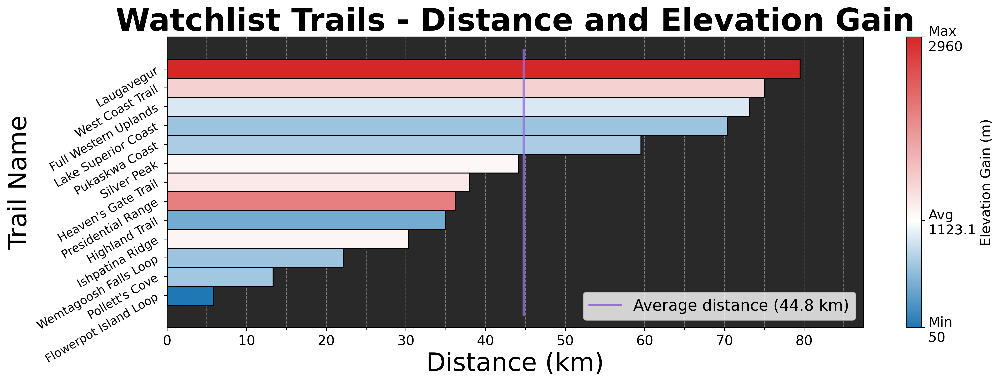

In [34]:
### Watchlist Trails - Distance and Elevation Gain

colorBarPlot(plotTitle = 'Watchlist Trails - Distance and Elevation Gain',
             xLabel = 'Distance (km)',
             trails = uncompletedTrails,
             barUnits = 'km',
             barTop = 'distance',
             barTopLabel = 'distance',
             colorRange = hotColdColors,
             colorCol = 'elevation_gain',
             legendLocation = 'lower right',
             colorLabel = 'Elevation Gain (m)',
             savePlot = True)

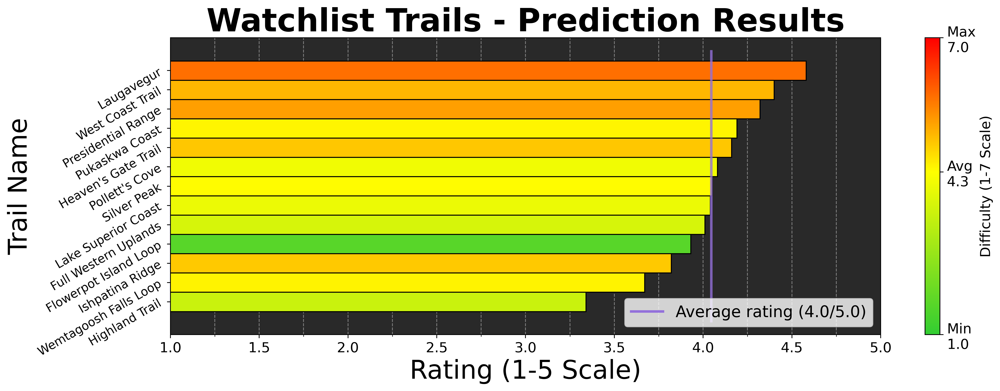

In [35]:
### Watchlist Trails - Prediction Results

colorBarPlot(plotTitle = 'Watchlist Trails - Prediction Results',
             xLabel = 'Rating (1-5 Scale)',
             trails = uncompletedTrails,
             barUnits = '/5.0',
             barUnitSpace = False,
             barTop = 'rating',
             barTopLabel = 'rating',
             colorRange = [difficultyColors[0], difficultyColors[1], difficultyColors[3]],
             colorMinMax = [1.0, 7.0],
             colorCol = 'difficulty',
             colorLabel = 'Difficulty (1-7 Scale)',
             legendLocation = 'lower right',
             xBounds = [1,5],
             savePlot = True)